In [ ]:
%pip install lime shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 8.9 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=3dfa23305df71148061979e00888d65048e1ec8f7dce46f38d91c6727f9dbbef
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

import lime
import shap


In [ ]:
from imblearn.over_sampling import SMOTE


smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(features, target)

print(f'''Shape of X before SMOTE: {features.shape}
          Shape of X after SMOTE: {X_smote.shape}''')

# print('\nBalance of positive and negative classes (%):')
# y_smote.value_counts(normalize=True) * 100

Shape of X before SMOTE: (1012, 5)
          Shape of X after SMOTE: (1212, 5)


In [ ]:
y_smote.value_counts()

0    404
1    404
2    404
Name: RiskLevel, dtype: int64

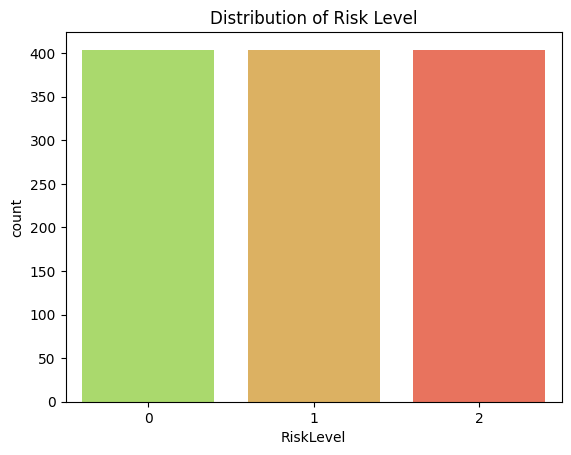

In [ ]:
risk_order = [0, 1, 2]
p_colors = ['#aceb5b', '#f0b74e', 'tomato']
sns.countplot(x=y_smote, order=risk_order, palette=p_colors)
plt.title("Distribution of Risk Level")
plt.show()

In [ ]:
# smote split

X_smote_train, X_smote_test, y_smote_train, y_smote_test = train_test_split(X_smote, y_smote, test_size=0.2, random_state=1)

random forest smote

In [ ]:
%pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107717 sha256=86fc0a2581da215af90679ea35fc574cc2335b09399ef9b6d32cb6bf696264a9
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
import eli5

In [ ]:
feature_names = ['Age', 'SystolicBP', 'DiastolicBP', 'BS', 'BodyTemp']
feature_names

['Age', 'SystolicBP', 'DiastolicBP', 'BS', 'BodyTemp']

In [ ]:
eli5.show_weights(xgb_smote, feature_names=feature_names)

Weight,Feature
0.3494,SystolicBP
0.2769,BS
0.1998,BodyTemp
0.0876,Age
0.0863,DiastolicBP


2. XGBoost Classifier

In [ ]:
# decision tree smote
dtc_smote = DecisionTreeClassifier()
dtc_smote.fit(X_smote_train, y_smote_train)

DecisionTreeClassifier()

In [ ]:
target_pred = dtc_smote.predict(X_smote_test)
print('Accuracy of Decision Tree Classifier on test set: {:.2f}'.format(accuracy_score(y_smote_test, target_pred)*100))

Accuracy of Decision Tree Classifier on test set: 85.19


In [ ]:
# classification report
print(classification_report(y_smote_test, target_pred))

              precision    recall  f1-score   support

           0       0.93      0.94      0.93        79
           1       0.85      0.81      0.83        84
           2       0.78      0.81      0.80        80

    accuracy                           0.85       243
   macro avg       0.85      0.85      0.85       243
weighted avg       0.85      0.85      0.85       243



3. Decision Tree Classifier

few other algorithms


In [ ]:
%pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 8.0 MB/s eta 0:00:00


after smote

SHAP EXPLAINER::

[16:40:42] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


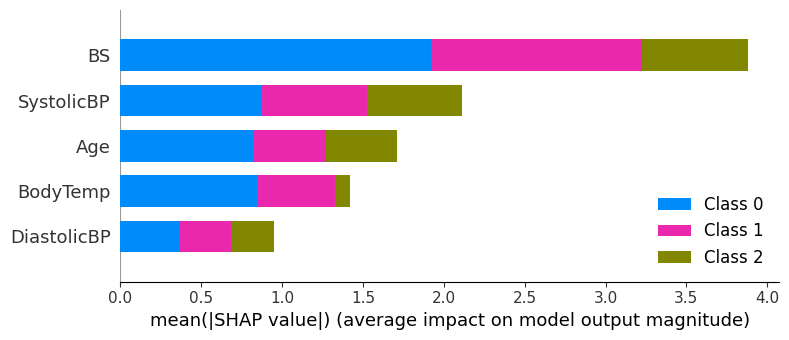

In [ ]:
shap_explainer = shap.TreeExplainer(xgb)
shap_values = shap_explainer.shap_values(feature_train)

shap.summary_plot(shap_values=shap_values, features=feature_test, feature_names=features.columns, plot_type='bar')
# print(value)

In [ ]:
shap.initjs()

In [ ]:
shap_values = shap_explainer.shap_values(feature_test.iloc[10].values.reshape(1, -1))
shap.force_plot(shap_explainer.expected_value[1], shap_values[1], feature_test.iloc[10], feature_names=features.columns.tolist())


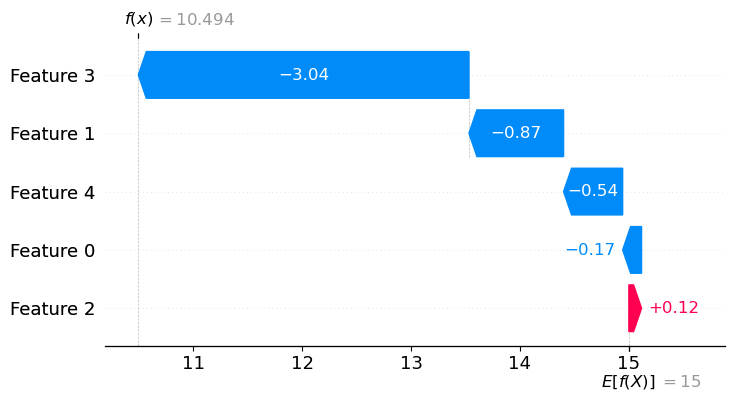

In [ ]:

sample_index = 0
explanation = shap.Explanation(shap_values[sample_index], feature_train.iloc[sample_index, :])

# Define your custom feature names
feature_names = feature_train.columns.tolist()

# Create the waterfall plot with custom feature names
shap.plots.waterfall(explanation[0], max_display=10, show=False)

# Display the plot
plt.show()


SHAP Explainer on XGB model before SMOTE

[16:40:56] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


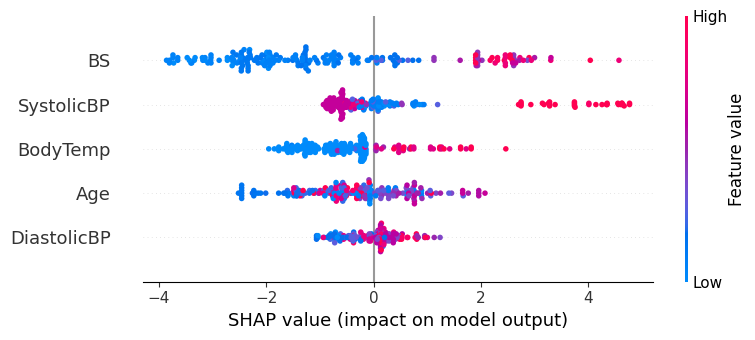

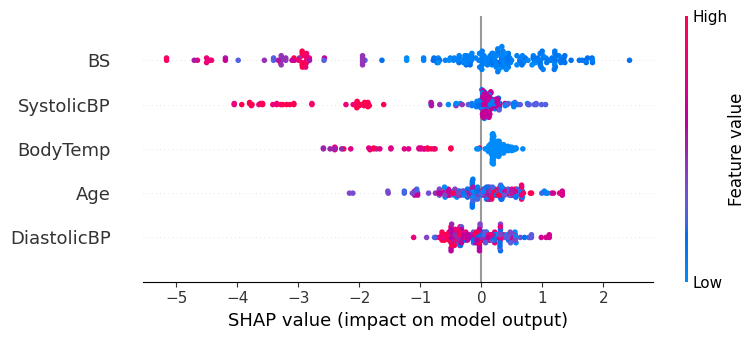

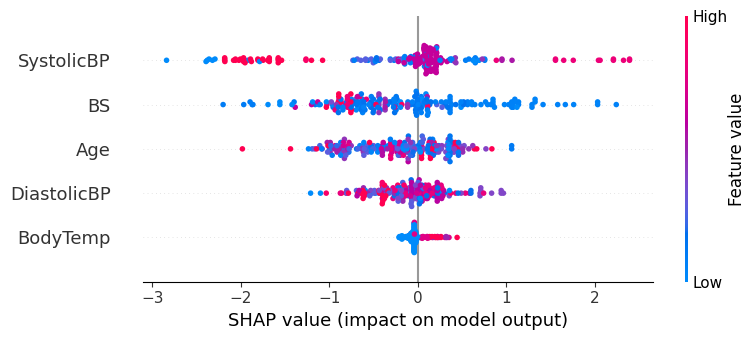

In [ ]:
explainer = shap.Explainer(xgb)
shap_values = explainer.shap_values(feature_test)
for i in range(3):
    shap.summary_plot(shap_values[i], feature_test)

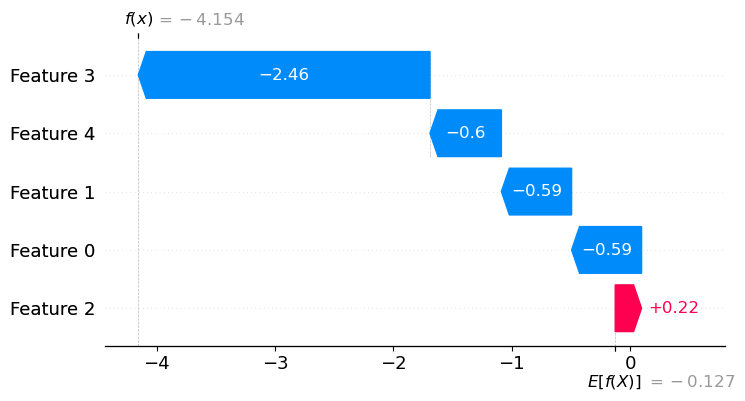

In [ ]:

explanation = shap.Explanation(values=shap_values[0], base_values=explainer.expected_value)
shap.waterfall_plot(explanation[0])

SHAP Explainer on XGBoost after SMOTE

[16:41:09] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


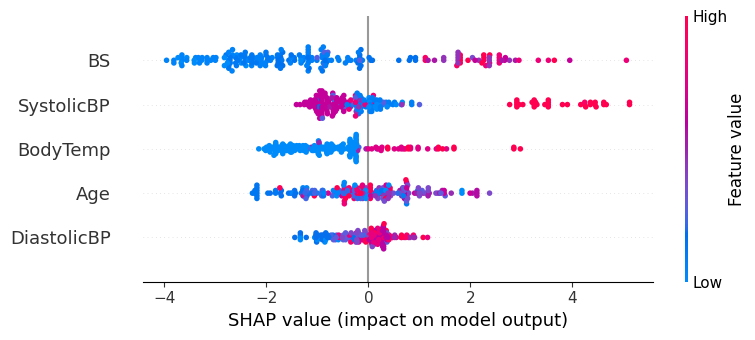

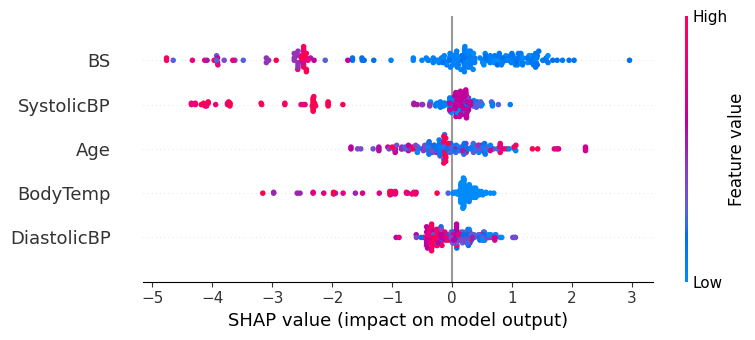

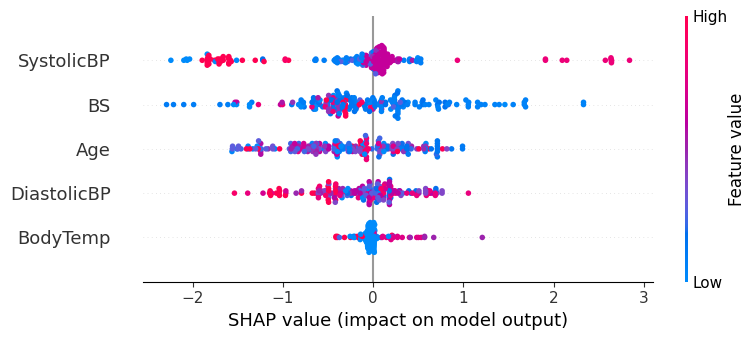

In [ ]:
explainer = shap.Explainer(xgb_smote)
shap_values = explainer.shap_values(feature_test)
for i in range(3):
    shap.summary_plot(shap_values[i], feature_test)

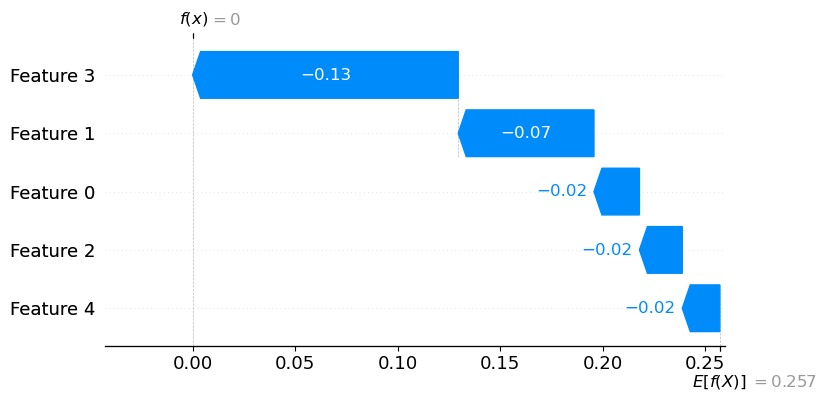

In [ ]:

explanation = shap.Explanation(values=shap_values[0], base_values=explainer.expected_value)
shap.waterfall_plot(explanation[0])

In [ ]:
# LIME Explainer before SMOTE

explainer = lime.lime_tabular.LimeTabularExplainer(feature_train.values, feature_names=feature_train.columns.tolist(), class_names=['low risk', 'mid risk', 'high risk'], discretize_continuous=True)


In [ ]:
# visualize the LIME explanation on XGB model before SMOTE
for sample_index in range(0, 4):
    exp = explainer.explain_instance(feature_test.values[sample_index], xgb.predict_proba, num_features=6, top_labels=1)
    exp.show_in_notebook(show_table=True, show_all=False)
    exp.save_to_file(f'lime_xgb_before_smote{sample_index}.html')

In [ ]:
exp.save_to_file('lime_xgb_before_smote.html')

In [ ]:
# LIME Explainer on XGBoost after SMOTE

explainer = lime.lime_tabular.LimeTabularExplainer(X_smote_train.values, feature_names=X_smote_train.columns.tolist(), class_names=['low risk', 'mid risk', 'high risk'], discretize_continuous=True)


In [ ]:
# visualize the LIME explanation on XGBoost SMOTE
for sample_index in range(0, 4):
    exp = explainer.explain_instance(feature_test.values[sample_index], xgb_smote.predict_proba, num_features=6, top_labels=1)
    exp.show_in_notebook(show_table=True, show_all=False)
    exp.save_to_file(f'lime_xgb_after_smote{sample_index}.html')

In [ ]:
exp.save_to_file('lime_xgb_after_smote.html')